<font size = "4">**Nama : Rizki Daffa Falih \
NPM : 2106726081**</font>

<font size = "6">**Import Library**</font>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

<font size = "6">**Data Observation**</font>

In [ ]:
#Mengambil data csv
train =  pd.read_csv('/content/train.csv')
test = pd.read_csv('/content/test.csv', index_col = 'id')
train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [ ]:
test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
id,,,,,,,,,,,,,,,,,,,,
1,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
2,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
3,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
4,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
5,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,1700,1,1.9,0,0,1,54,0.5,170,7,17,644,913,2121,14,8,15,1,1,0
997,609,0,1.8,1,0,0,13,0.9,186,4,2,1152,1632,1933,8,1,19,0,1,1
998,1185,0,1.4,0,1,1,8,0.5,80,1,12,477,825,1223,5,0,14,1,0,0


In [ ]:
#Mengambil data txt
with open('/content/Penjelasan Dataset.txt', 'r') as f:
  print(f.read())

Tentang Dataset

Andrew telah memulai perusahaan selulernya sendiri. Dia ingin memberikan perlawanan yang sulit kepada perusahaan-perusahaan besar seperti Apple, Samsung, dll.

Dia tidak tahu bagaimana memperkirakan harga ponsel yang dibuat oleh perusahaannya. Di pasar ponsel yang kompetitif ini, Anda tidak bisa begitu saja mengasumsikan sesuatu. Untuk mengatasi masalah ini, dia mengumpulkan data penjualan ponsel dari berbagai perusahaan.

Andrew ingin mengetahui hubungan antara fitur-fitur ponsel (misal: RAM, Memori Internal, dll) dan harga jualnya. Tetapi dia tidak begitu ahli dalam Machine Learning. Jadi dia membutuhkan bantuan Anda untuk menyelesaikan masalah ini.

Dalam masalah ini Anda tidak perlu memprediksi harga aktual tetapi kisaran harga yang menunjukkan seberapa tinggi harga tersebut




In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 1 to 1000
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  1000 non-null   int64  
 1   blue           1000 non-null   int64  
 2   clock_speed    1000 non-null   float64
 3   dual_sim       1000 non-null   int64  
 4   fc             1000 non-null   int64  
 5   four_g         1000 non-null   int64  
 6   int_memory     1000 non-null   int64  
 7   m_dep          1000 non-null   float64
 8   mobile_wt      1000 non-null   int64  
 9   n_cores        1000 non-null   int64  
 10  pc             1000 non-null   int64  
 11  px_height      1000 non-null   int64  
 12  px_width       1000 non-null   int64  
 13  ram            1000 non-null   int64  
 14  sc_h           1000 non-null   int64  
 15  sc_w           1000 non-null   int64  
 16  talk_time      1000 non-null   int64  
 17  three_g        1000 non-null   int64  
 18  touch_sc

In [ ]:
#Melihat data yang berisi 0 dan 1
for i in train.columns:
  if train[i].isin([0,1]).all():
    print(train[i].value_counts())

0    1010
1     990
Name: blue, dtype: int64
1    1019
0     981
Name: dual_sim, dtype: int64
1    1043
0     957
Name: four_g, dtype: int64
1    1523
0     477
Name: three_g, dtype: int64
1    1006
0     994
Name: touch_screen, dtype: int64
1    1014
0     986
Name: wifi, dtype: int64


In [ ]:
#Melihat data yang berisi 0 dan 1
for i in test.columns:
  if test[i].isin([0,1]).all():
    print(test[i].value_counts())

1    516
0    484
Name: blue, dtype: int64
1    517
0    483
Name: dual_sim, dtype: int64
0    513
1    487
Name: four_g, dtype: int64
1    756
0    244
Name: three_g, dtype: int64
1    500
0    500
Name: touch_screen, dtype: int64
1    507
0    493
Name: wifi, dtype: int64


<font size = "6">**Data Cleaning**</font>

In [ ]:
#Melihat jumlah data yang duplicated
train.duplicated().sum()

0

In [ ]:
#Melihat jumlah data yang duplicated
test.duplicated().sum()

0

In [ ]:
#Melihat jumlah data yang na
train.isna().sum().sum()

0

In [ ]:
#Melihat jumlah data yang na
test.isna().sum().sum()

0

<font size = "6">**EDA**</font>

In [ ]:
#Descrive data train
train.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
#Descrive data test
test.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000
mean,1248.510000,0.516000,1.540900,0.517000,4.593000,0.487000,33.652000,0.517500,139.51100,4.328000,10.054000,627.121000,1239.774000,2138.998000,11.995000,5.316000,11.085000,0.756000,0.50000,0.507000
std,432.458227,0.499994,0.829268,0.499961,4.463325,0.500081,18.128694,0.280861,34.85155,2.288155,6.095099,432.929699,439.670981,1088.092278,4.320607,4.240062,5.497636,0.429708,0.50025,0.500201
min,500.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.00000,1.000000,0.000000,0.000000,501.000000,263.000000,5.000000,0.000000,2.000000,0.000000,0.00000,0.000000
25%,895.000000,0.000000,0.700000,0.000000,1.000000,0.000000,18.000000,0.300000,109.75000,2.000000,5.000000,263.750000,831.750000,1237.250000,8.000000,2.000000,6.750000,1.000000,0.00000,0.000000
50%,1246.500000,1.000000,1.500000,1.000000,3.000000,0.000000,34.500000,0.500000,139.00000,4.000000,10.000000,564.500000,1250.000000,2153.500000,12.000000,5.000000,11.000000,1.000000,0.50000,1.000000
75%,1629.250000,1.000000,2.300000,1.000000,7.000000,1.000000,49.000000,0.800000,170.00000,6.000000,16.000000,903.000000,1637.750000,3065.500000,16.000000,8.000000,16.000000,1.000000,1.00000,1.000000
max,1999.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.00000,8.000000,20.000000,1907.000000,1998.000000,3989.000000,19.000000,18.000000,20.000000,1.000000,1.00000,1.000000


In [ ]:
#Membuat array berisi kolom yang data kontinu
col1 = []
for i in train.columns:
  if train[i].isin([0,1]).all():
    True
  else:
    col1.append(i)
print(col1)

['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'price_range']


In [ ]:
#Membuat array berisi kolom yang data kontinu
col = []
for i in test.columns:
  if test[i].isin([0,1]).all():
    True
  else:
    col.append(i)
print(col)

['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']


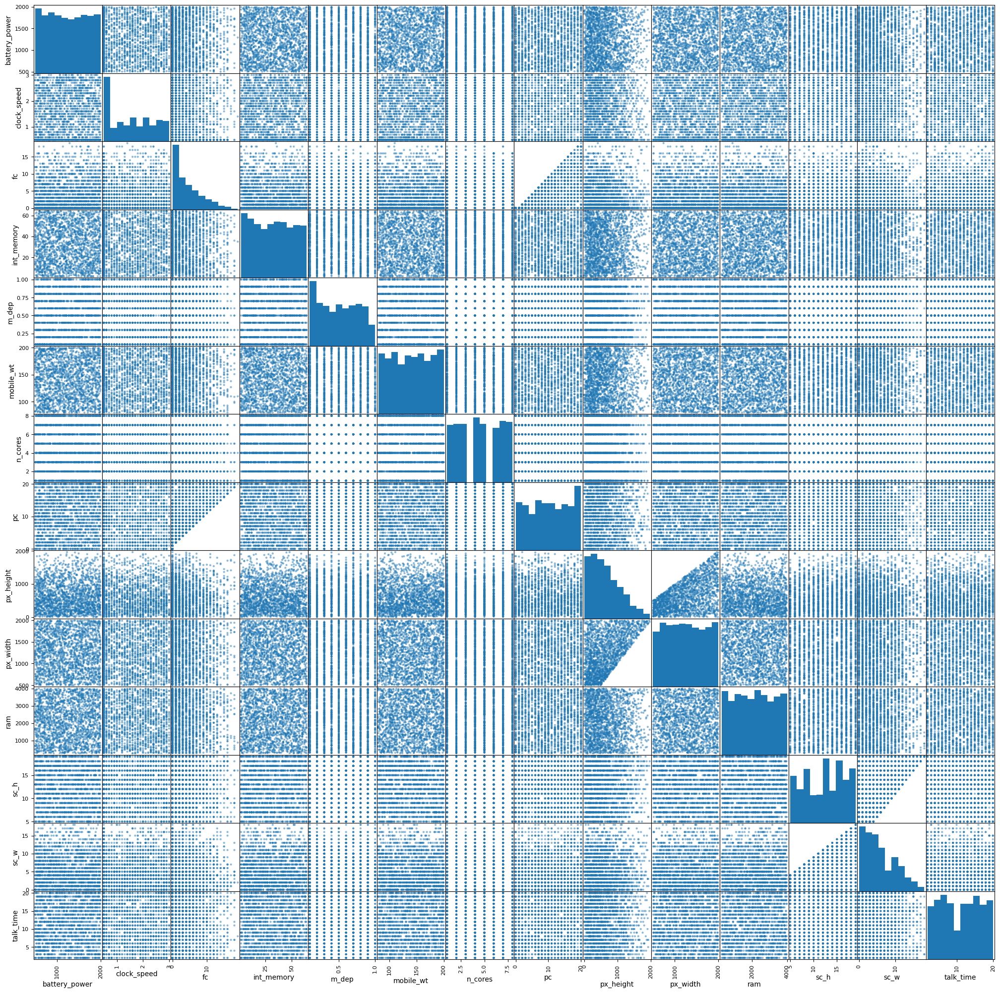

In [ ]:
#Membuat Plotting Data Train
pd.plotting.scatter_matrix(train[col1], figsize=(25,25)) # plot data yang bukan hanya berisi 0 dan 1
plt.show()
#Bisa dizoom dengan diklik plotnya

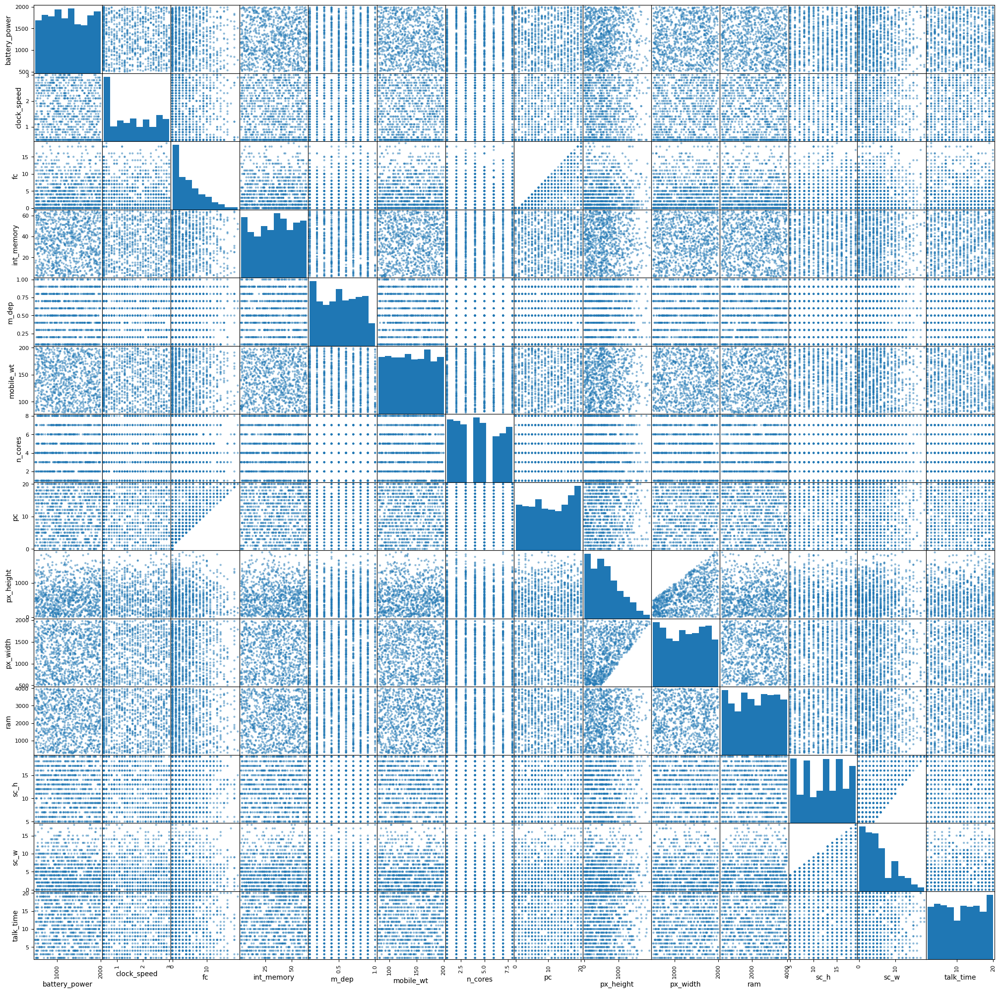

In [ ]:
#Membuat Plotting Data Test
pd.plotting.scatter_matrix(test[col], figsize=(25,25)) # plot data yang bukan hanya berisi 0 dan 1
plt.show()
#Bisa dizoom dengan diklik plotnya

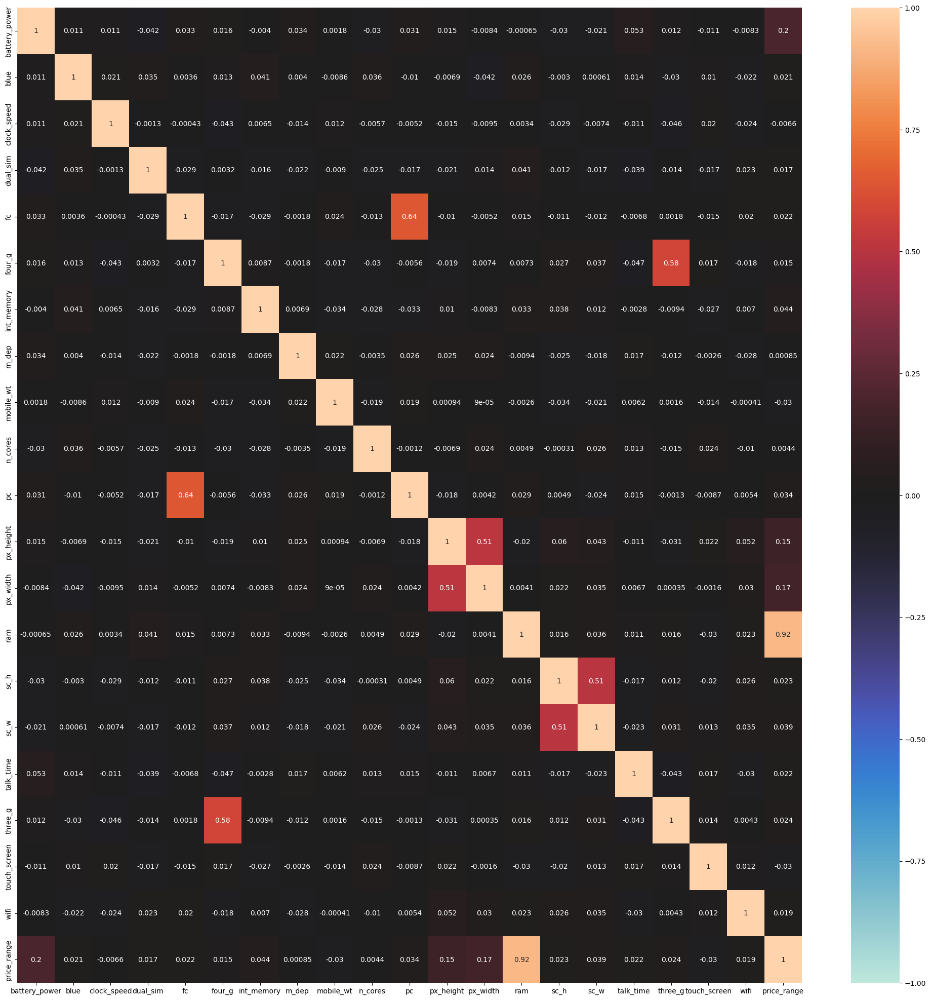

In [ ]:
#Membuat Heatmap Data Train
corr = train.corr()
plt.subplots(figsize=(25,25))
sns.heatmap(corr, vmin=-1, center=0, vmax=1, annot=True)
plt.show()
#Bisa dizoom dengan diklik plotnya

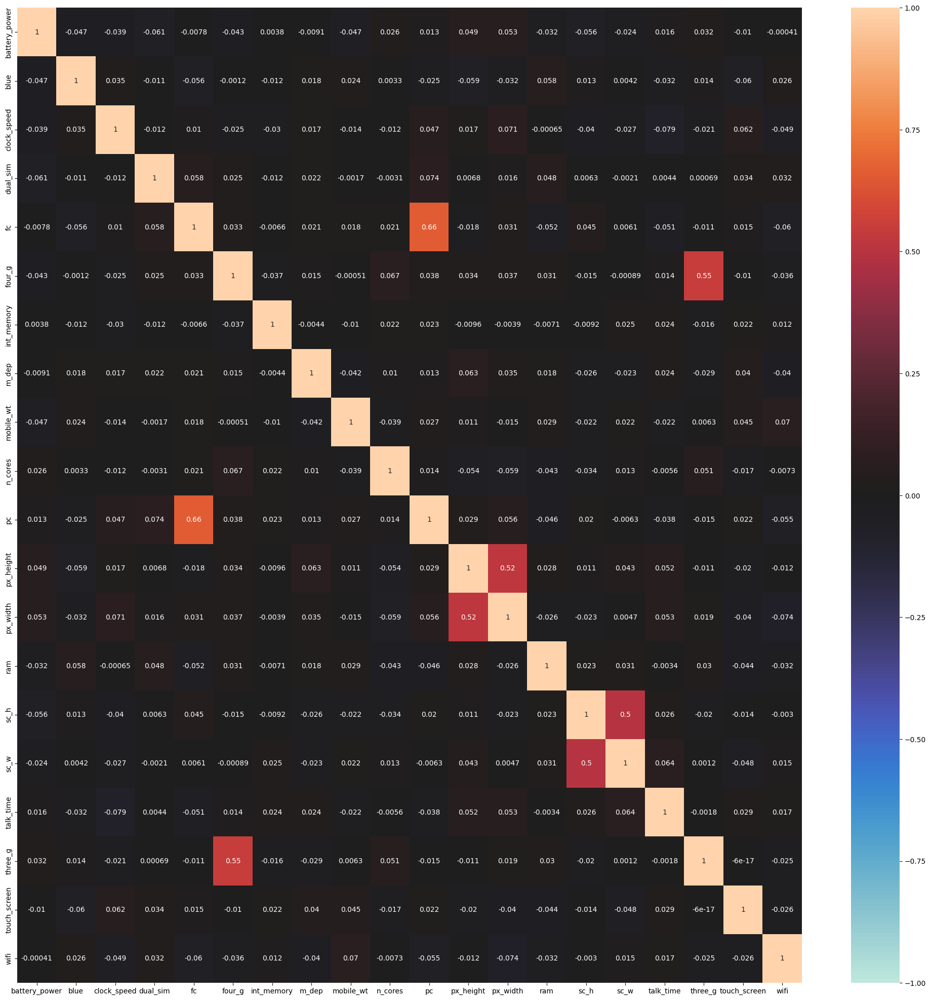

In [ ]:
#Membuat Heatmap Data Test
corr = test.corr()
plt.subplots(figsize=(25,25))
sns.heatmap(corr, vmin=-1, center=0, vmax=1, annot=True)
plt.show()
#Bisa dizoom dengan diklik plotnya

<font size = "6">**Data Preprocessing**</font>

In [ ]:
X = train.drop('price_range',axis=1).copy()
y = train['price_range']
X

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1


In [ ]:
y

0       1
1       2
2       2
3       2
4       1
       ..
1995    0
1996    2
1997    3
1998    0
1999    3
Name: price_range, Length: 2000, dtype: int64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
sc = StandardScaler()
#Membuat array berisi kolom yang data kontinu
col = []
for i in X.columns:
  if X[i].isin([0,1]).all():
    True
  else:
    col.append(i)
print(col)
X_train.loc[:,col] = sc.fit_transform(X_train.loc[:,col]) #col tidak mengandung data yang berisi hanya 0 dan 1

['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']


In [ ]:
X_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
968,1.548360,0,-1.236230,1,0.620111,0,0.754832,-0.008935,1.425710,-1.547446,0.020269,0.275712,1.181997,-0.580476,-0.528061,0.759509,-1.445123,1,1,1
240,-1.379535,1,0.837112,0,-0.993561,1,0.919763,-1.403674,-0.046246,1.510316,-1.476497,-0.258762,-0.556547,1.336453,-0.290196,-1.084869,0.915929,1,1,1
819,-0.010914,0,-0.748385,1,-0.532512,1,1.359577,-1.403674,1.340790,-1.547446,0.685498,-0.285711,-1.020159,-0.657302,0.423400,1.451150,1.642407,1,0,1
692,-1.043621,0,-0.504462,0,-0.532512,0,0.315017,-0.357620,1.623858,0.199847,-0.478653,-0.764042,0.984962,1.288322,0.185535,0.528962,-1.081884,0,0,1
420,0.488416,1,-1.236230,1,0.620111,0,-1.389265,-0.357620,-1.008680,0.199847,0.352883,0.401470,-0.336332,-0.489767,-1.479523,-0.162680,1.642407,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,1.666383,1,0.471228,1,-0.532512,0,-0.069821,1.385804,0.293436,-1.547446,1.184419,0.293677,0.829652,0.838477,0.185535,-0.162680,1.460787,0,0,1
1294,-1.479401,1,-1.236230,0,-0.763036,1,1.469531,0.688434,0.151902,1.510316,-0.977575,0.257746,1.411485,-1.623634,0.899131,0.990056,-0.900264,1,1,1
860,1.335009,1,-1.236230,0,-0.993561,1,-0.949450,-0.357620,0.548198,0.199847,-0.478653,0.190375,0.041512,-0.033443,0.899131,1.220603,0.189452,1,0,1
1459,1.557438,0,-0.748385,1,-0.301987,0,-1.169357,-0.357620,1.397403,1.510316,0.352883,-0.344098,0.595528,0.740363,0.899131,1.220603,1.279168,0,1,1


In [ ]:
X_test.loc[:,col] = sc.transform(X_test.loc[:,col])
X_test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
1860,0.919657,0,1.202995,0,-0.301987,1,-0.399682,0.339750,1.680472,-1.110623,-0.811268,-0.972891,0.831970,-1.323738,-1.003792,0.067867,0.007832,1,1,0
353,-0.133477,0,-1.236230,0,0.620111,1,-1.334288,-0.008935,-0.074553,1.510316,1.018112,-0.829167,-0.609863,0.413624,1.612728,2.603886,1.460787,1,0,0
1333,1.659574,0,1.690840,0,1.081160,0,-1.004427,-0.357620,1.567245,1.073493,1.350727,-0.788745,-0.688677,-0.740606,-1.003792,-1.084869,-0.537026,1,1,0
905,-0.571527,1,0.593189,0,-0.071463,0,-0.839496,-1.054989,0.718039,-0.673800,1.517034,-0.871835,0.335906,1.643754,1.374862,0.298414,1.460787,1,1,0
1289,-1.420389,1,-1.236230,1,0.620111,0,1.414554,-0.008935,-0.301008,0.199847,-0.312346,0.846117,1.643291,-0.194499,0.423400,-0.162680,-1.081884,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
965,0.313651,0,-1.236230,1,-0.763036,0,-0.729543,-0.706304,-0.187781,1.510316,1.184419,-0.577650,-1.340051,1.662266,-0.290196,-0.854321,1.460787,0,1,1
1284,-0.566987,0,0.593189,0,-0.532512,1,-1.114381,-0.706304,0.491584,0.199847,-0.644960,1.268306,0.994235,-0.094533,-0.290196,0.759509,-0.173787,1,0,0
1739,-0.446694,0,0.349267,0,-0.071463,1,-1.114381,0.688434,-1.036986,0.636670,-0.811268,1.315465,0.032240,-0.298167,1.374862,0.298414,1.460787,1,1,1
261,-1.163915,0,1.446918,1,-0.993561,0,-0.399682,-1.054989,-1.489896,-0.236977,-1.476497,-0.265499,0.648844,-0.071393,-1.717388,-1.084869,0.189452,1,1,1


<font size = "6">**Model Selection**</font>

In [ ]:
log_regr = LogisticRegression()
svc = SVC()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()

In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# melakukan cross validation pada masing-masing metode
lr_score = cross_val_score(log_regr, X_train, y_train, cv=kfold, scoring='f1_weighted').mean()
svc_score = cross_val_score(svc, X_train, y_train, cv=kfold, scoring='f1_weighted').mean()
dt_score = cross_val_score(dt, X_train, y_train, cv=kfold, scoring='f1_weighted').mean()
rf_score = cross_val_score(rf, X_train, y_train, cv=kfold, scoring='f1_weighted').mean()

In [ ]:
for i in [lr_score, svc_score, dt_score, rf_score]:
    print(i)

0.9537860120920542
0.8857183142586778
0.8236616607230747
0.8611398757036633


<font size = "6">**Hyperparameter Tuning**</font>

In [ ]:
params = {'C':[0.01,0.05,0.1,0.7,0.5,1,5,10,50,100],     # hyperparameter yang akan dievaluasi untuk SVC
             'kernel':['poly','rbf']}

grid_search = GridSearchCV(svc, params, cv=kfold, error_score='raise')
grid_search.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             error_score='raise', estimator=SVC(),
             param_grid={'C': [0.01, 0.05, 0.1, 0.7, 0.5, 1, 5, 10, 50, 100],
                         'kernel': ['poly', 'rbf']})

In [ ]:
grid_search.best_params_, grid_search.cv_results_['mean_test_score'].max()

({'C': 0.7, 'kernel': 'rbf'}, 0.8875)

In [ ]:
model = grid_search.best_estimator_
model.fit(X_train,y_train)

SVC(C=0.7)

In [ ]:
y_pred = model.predict(X_test)
y_pred

array([0, 1, 1, 3, 1, 1, 2, 0, 3, 1, 0, 1, 1, 3, 3, 2, 3, 3, 1, 0, 0, 2,
       1, 2, 0, 1, 3, 2, 2, 0, 0, 0, 3, 0, 1, 1, 2, 0, 3, 0, 2, 3, 2, 0,
       2, 3, 1, 1, 3, 1, 3, 1, 0, 0, 1, 0, 1, 3, 0, 0, 1, 3, 3, 1, 0, 0,
       3, 3, 1, 2, 2, 2, 0, 1, 2, 0, 0, 3, 2, 2, 3, 2, 1, 0, 1, 3, 1, 3,
       3, 0, 3, 3, 2, 1, 3, 2, 2, 3, 1, 1, 0, 0, 1, 0, 0, 3, 2, 0, 1, 1,
       0, 0, 2, 1, 3, 2, 3, 2, 0, 2, 1, 3, 2, 1, 3, 3, 0, 2, 0, 2, 3, 0,
       2, 2, 0, 3, 1, 0, 1, 2, 3, 1, 2, 2, 0, 0, 0, 1, 1, 2, 3, 1, 1, 0,
       2, 2, 0, 1, 0, 1, 2, 3, 2, 3, 1, 0, 0, 2, 2, 3, 2, 1, 0, 0, 3, 1,
       1, 2, 1, 1, 0, 0, 0, 0, 3, 2, 0, 2, 0, 0, 0, 0, 1, 3, 3, 2, 0, 1,
       2, 1, 1, 1, 2, 3, 3, 3, 1, 2, 0, 0, 0, 2, 1, 1, 3, 1, 0, 2, 1, 1,
       3, 2, 3, 0, 0, 2, 1, 3, 0, 1, 2, 0, 2, 3, 2, 0, 1, 3, 3, 0, 1, 3,
       2, 3, 0, 3, 1, 2, 3, 3, 2, 1, 1, 3, 3, 1, 3, 3, 3, 2, 3, 0, 1, 2,
       2, 2, 3, 0, 1, 3, 2, 2, 2, 1, 0, 1, 0, 2, 3, 1, 3, 1, 0, 3, 1, 2,
       0, 0, 2, 0, 1, 2, 3, 3, 3, 1, 1, 0, 1, 3, 3,

<font size = "6">**Model Evaluation**</font>

In [ ]:
f1_score(y_test,y_pred, average='weighted')

0.9083752629733519


------------------------Machine Learning - Classification------------------------


Classification Report for Data Test

              precision    recall  f1-score   support

           0       0.97      0.94      0.96       105
           1       0.83      0.92      0.87        91
           2       0.85      0.85      0.85        92
           3       0.97      0.91      0.94       112

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.90       400
weighted avg       0.91      0.91      0.91       400

--------------------------------------------------------------------------


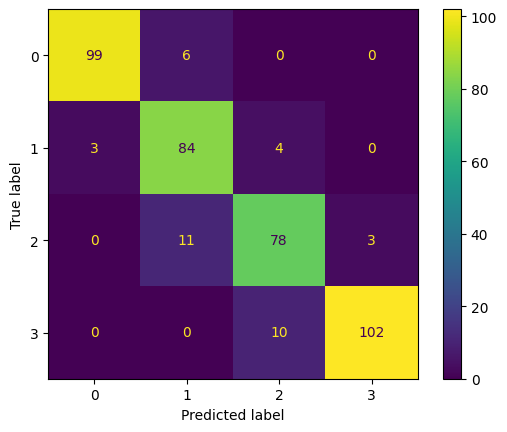

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

def evaluation_parametrics(name,y_val, y_pred):

    print("\n------------------------{}------------------------\n".format(name))

    cm_test = confusion_matrix(y_val, y_pred)
    t1 = ConfusionMatrixDisplay(cm_test)
    print("\nClassification Report for Data Test\n")
    print(classification_report(y_val, y_pred))
    print("--------------------------------------------------------------------------")

    t1.plot()
evaluation_parametrics("Machine Learning - Classification", y_test, y_pred)

In [ ]:
print(np.concatenate((y_test.values.reshape(len(y_test),1),y_pred.reshape(len(y_pred),1)),1))

[[0 0]
 [2 1]
 [1 1]
 [3 3]
 [1 1]
 [1 1]
 [2 2]
 [0 0]
 [3 3]
 [1 1]
 [0 0]
 [0 1]
 [2 1]
 [3 3]
 [3 3]
 [2 2]
 [3 3]
 [3 3]
 [1 1]
 [0 0]
 [0 0]
 [2 2]
 [1 1]
 [2 2]
 [0 0]
 [1 1]
 [3 3]
 [2 2]
 [2 2]
 [0 0]
 [0 0]
 [0 0]
 [3 3]
 [0 0]
 [1 1]
 [1 1]
 [2 2]
 [0 0]
 [3 3]
 [0 0]
 [2 2]
 [3 3]
 [2 2]
 [0 0]
 [2 2]
 [3 3]
 [2 1]
 [1 1]
 [3 3]
 [1 1]
 [3 3]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [3 3]
 [0 0]
 [0 0]
 [1 1]
 [3 3]
 [3 3]
 [1 1]
 [0 0]
 [0 0]
 [3 3]
 [3 3]
 [1 1]
 [2 2]
 [2 2]
 [2 2]
 [0 0]
 [1 1]
 [2 2]
 [0 0]
 [1 0]
 [3 3]
 [2 2]
 [2 2]
 [3 3]
 [2 2]
 [1 1]
 [0 0]
 [1 1]
 [3 3]
 [1 1]
 [3 3]
 [3 3]
 [0 0]
 [3 3]
 [3 3]
 [2 2]
 [1 1]
 [3 3]
 [2 2]
 [2 2]
 [3 3]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [3 3]
 [2 2]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [3 2]
 [1 1]
 [3 3]
 [2 2]
 [3 3]
 [2 2]
 [0 0]
 [2 2]
 [1 1]
 [3 3]
 [2 2]
 [1 1]
 [3 3]
 [3 3]
 [0 0]
 [2 2]
 [0 0]
 [2 2]
 [3 3]
 [0 0]
 [2 2]
 [2 2]
 [0 0]
 [3 3]
 [1 1]
 [0 0]
 [0 1]
 [2 2]
 [2 3]
 [1 1]
 [3 2]

<font size = "6">**Features Important**</font>

In [ ]:
from sklearn.inspection import permutation_importance
result = permutation_importance(model, X_test, y_test, n_repeats=10, scoring='f1_weighted', random_state=42)

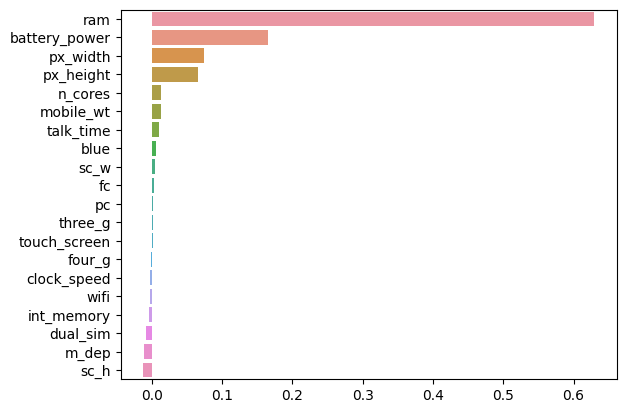

In [ ]:
result_sorted = []
columns_sorted = []

for res, col in sorted(zip(result.importances_mean, X_test.columns.values), reverse=True):
  result_sorted.append(res)
  columns_sorted.append(col)

sns.barplot(x = result_sorted, y = columns_sorted)
plt.show()

<font size = "6">**Save Model**</font>

In [ ]:
import joblib
joblib.dump(model,'Model_Klasifikasi.pkl')

['Model_Klasifikasi.pkl']